In [2]:
import pandas as pd
import numpy as np

In [17]:
df = pd.read_pickle("defect_df.p")

In [18]:
df = df[df["defect_formation_energy"] > 0]

In [18]:
df.describe()

,defect_formation_energy
count,1665.000000
mean,5.252773
std,1.397048
min,1.410276
25%,4.186142
50%,5.296275
75%,6.414063
max,8.303126


# Coulomb Matrix


In [3]:
from matminer.featurizers.structure.matrix import CoulombMatrix

cm = CoulombMatrix()
cm.fit(df["defect_structure_original"])
df_cm = cm.featurize_dataframe(df, "defect_structure_original")

CoulombMatrix:   0%|          | 0/1667 [00:00<?, ?it/s]

/home/saaj/.local/lib/python3.8/site-packages/matminer/featurizers/structure/matrix.py:101: ComplexWarning: Casting complex values to real discards the imaginary part
  zeros[: len(eigs)] = eigs
/home/saaj/.local/lib/python3.8/site-packages/matminer/featurizers/structure/matrix.py:101: ComplexWarning: Casting complex values to real discards the imaginary part
  zeros[: len(eigs)] = eigs
/home/saaj/.local/lib/python3.8/site-packages/matminer/featurizers/structure/matrix.py:101: ComplexWarning: Casting complex values to real discards the imaginary part
  zeros[: len(eigs)] = eigs
/home/saaj/.local/lib/python3.8/site-packages/matminer/featurizers/structure/matrix.py:101: ComplexWarning: Casting complex values to real discards the imaginary part
  zeros[: len(eigs)] = eigs
/home/saaj/.local/lib/python3.8/site-packages/matminer/featurizers/structure/matrix.py:101: ComplexWarning: Casting complex values to real discards the imaginary part
  zeros[: len(eigs)] = eigs
/home/saaj/.local/lib/pyt

In [5]:
df_cm = pd.read_pickle("./defect_df_cm_5")

df_cm = df_cm[df_cm["defect_formation_energy"] > 0]

df_cm_dropped = df_cm.drop(["name","formula","mp_id", "host_structure", "defect_index", "defect_structure_relaxed", "defect_structure_original","defect_formation_energy"],axis=1)

y = df_cm["defect_formation_energy"]

In [6]:
def corr_reduction(corr, thresh, data):    
    columns = np.full((corr.shape[0],), True, dtype=bool)
    for i in range(corr.shape[0]):
        for j in range(i+1, corr.shape[0]):
            if corr.iloc[i,j] >= thresh:
                if columns[j]:
                    columns[j] = False
    selected_columns = data.columns[columns]
    data = data[selected_columns]
    return data

In [11]:
df_cm_reduced = corr_reduction(df_cm_dropped.corr(),0.9, df_cm_dropped)

In [92]:
df_cm_reduced.head()

,coulomb matrix eig 0,coulomb matrix eig 16,coulomb matrix eig 72,coulomb matrix eig 73,coulomb matrix eig 96,coulomb matrix eig 97,coulomb matrix eig 109,coulomb matrix eig 128,coulomb matrix eig 144,coulomb matrix eig 181,...,coulomb matrix eig 213,coulomb matrix eig 219,coulomb matrix eig 223,coulomb matrix eig 227,coulomb matrix eig 228,coulomb matrix eig 230,coulomb matrix eig 246,coulomb matrix eig 250,coulomb matrix eig 295,coulomb matrix eig 322
1917,43607.265500,15117.647072,2188.256750,1968.926553,1640.998880,1641.008631,1617.860978,1602.433193,1554.883160,77.514514,...,66.692702,66.486861,65.377399,65.022843,65.059034,52.259756,63.430295,63.920303,60.184949,55.660664
1827,18730.303508,2848.300364,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
352,31017.498598,14940.958723,580.393404,584.734292,593.235689,593.235689,217.033047,190.916519,101.142276,66.618899,...,62.721210,61.853641,61.611376,61.353864,63.595772,54.432603,56.798344,56.430765,55.824070,55.539354
91,21353.709559,7315.152399,172.189383,172.189383,94.901741,94.901741,16.422840,15.214156,68.974154,68.974154,...,61.622248,60.849285,54.665089,53.721444,53.721444,53.721444,59.277028,53.426846,57.618264,0.000000
1868,46501.656821,19028.299024,2916.173972,2885.948519,1864.813336,1850.315635,1961.758307,1935.619615,171.051369,67.893042,...,62.719090,64.295155,56.050513,63.426996,63.426996,60.940593,56.709062,58.554125,56.808192,57.125968


In [151]:
print(df_cm_reduced.shape)
print(df_cm_dropped.shape)


(1665, 27)
(1665, 479)


# CM Train_Test

In [209]:
from sklearn.model_selection import train_test_split
cm_train, cm_test, y_train,y_test = train_test_split(df_cm_reduced, y.to_numpy(), test_size = 0.15, random_state = 42)

In [210]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state = 42)
rf.fit(cm_train, y_train)

RandomForestRegressor(random_state=42)

In [211]:
from sklearn.metrics import mean_squared_error
cm_predictions = rf.predict(cm_train)
cm_rmse = np.sqrt(mean_squared_error(y_train,cm_predictions))
print(cm_rmse)

cm_test_pred = rf.predict(cm_test)
cm_test_rmse = np.sqrt(mean_squared_error(y_test,cm_test_pred))
print(cm_test_rmse)

0.3355825452797634
0.8477170501885967


In [212]:
from sklearn.metrics import r2_score
cm_train_r2 = r2_score(y_train,cm_predictions)
cm_test_r2 = r2_score(y_test,cm_test_pred)

print(cm_train_r2)
print(cm_test_r2)

0.9429615972282094
0.6023536969207551


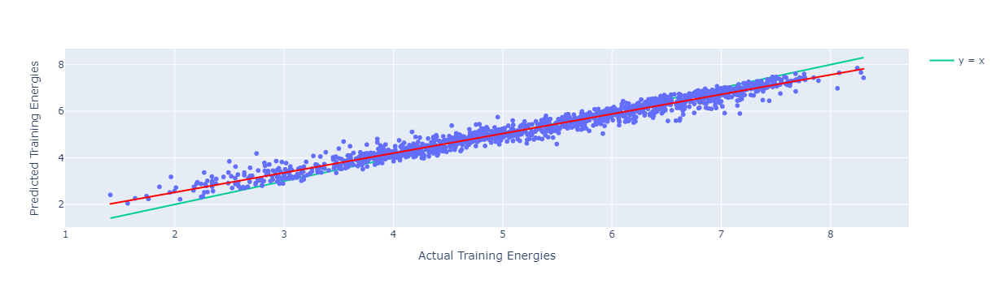

In [33]:
import plotly.express as px
import plotly.graph_objects as go
y_train_removed = np.delete(y_train,589)
cm_pred_removed = np.delete(cm_predictions,589)
fig = px.scatter(x = y_train_removed, y = cm_pred_removed,trendline = 'ols',trendline_color_override = 'red', labels = {"x":"Actual Training Energies", "y":"Predicted Training Energies"})
# fig.update_xaxes(range = [1,9])
# fig.update_yaxes(range = [0,10])
fig.add_trace(go.Scatter(x=y_train, y = y_train, mode = "lines",name = "y = x"))

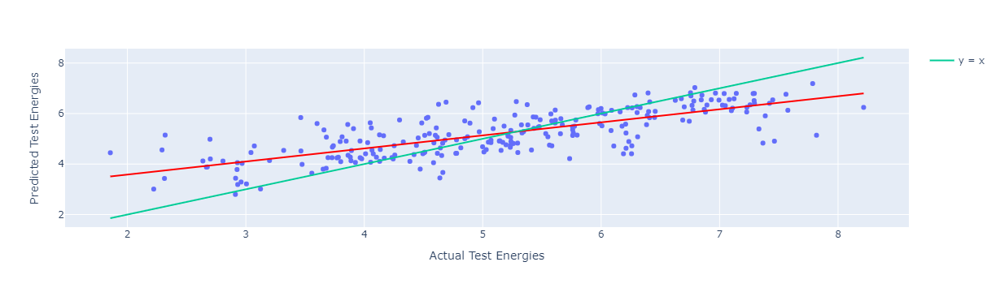

In [34]:
import plotly.express as p
fig = px.scatter(x = y_test, y = cm_test_pred,trendline = 'ols',trendline_color_override = 'red', labels = {"x":"Actual Test Energies", "y":"Predicted Test Energies"})
# fig.update_xaxes(range = [1,9])
# fig.update_yaxes(range = [0,10])
fig.add_trace(go.Scatter(x=y_test, y = y_test, mode = "lines",name = "y = x"))

In [219]:
results_reduced = pd.DataFrame({"Featuriser":["CoulombMatrix"],"Model":["RandomForestRegressor"], "train_rmse":[cm_rmse],"test_rmse":[cm_test_rmse], "train_r2":[cm_train_r2],"test_r2":[cm_test_r2],"feature_len":df_cm_reduced.shape[1]})
results_reduced.head()

,Featuriser,Model,train_rmse,test_rmse,train_r2,test_r2,feature_len
0,CoulombMatrix,RandomForestRegressor,0.335583,0.847717,0.942962,0.602354,27


# CM Cross-Val + Feature Reduction

In [8]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestRegressor

rf_cm_cv = RandomForestRegressor()
kf = KFold(n_splits = 5, shuffle = True, random_state = 42)
output_cm = cross_validate(rf_cm_cv, df_cm_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)





NameError: name 'df_cm_reduced' is not defined

In [141]:
output_cm['test_score'].mean()

-0.8826809079303259

In [12]:
from sklearn.ensemble import GradientBoostingRegressor
kf = KFold(n_splits = 5, shuffle = True, random_state = 42)
gbr_cm = GradientBoostingRegressor()
output_gbr_cm = cross_validate(gbr_cm, df_cm_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)


In [13]:
output_gbr_cm['test_score'].mean()

-0.9720345694106453

In [17]:
import xgboost
xg_cm = cross_validate(xgboost.XGBRegressor(), df_cm_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)
xg_cm["test_score"].mean()

/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int6

-0.9071020339538125

In [25]:
def extract_importances(output):
    overall_cm = {}
    for idx,estimator in enumerate(output['estimator']):
        feature_importances = pd.DataFrame(estimator.feature_importances_,
                                           index = estimator.feature_names_in_,
                                            columns=['importance']).sort_values('importance', ascending=False)
        feature_importances = feature_importances.rename(columns = {"importance":"importance" + str(idx)})
        overall_cm[idx] = feature_importances


    overall_cm_df = overall_cm[0]
    overall_cm_df = overall_cm_df.merge(overall_cm[1], left_index = True, how = 'outer', right_index =True)
    overall_cm_df = overall_cm_df.merge(overall_cm[2], left_index = True, how = 'outer', right_index =True)
    overall_cm_df = overall_cm_df.merge(overall_cm[3], left_index = True, how = 'outer', right_index =True)
    overall_cm_df = overall_cm_df.merge(overall_cm[4], left_index = True, how = 'outer', right_index =True)
    overall_cm_df["average"] = overall_cm_df.mean(axis = 1)
    return overall_cm_df

# overall_cm_df = extract_importances(output_cm)
# overall_cm_df.head(21)

In [13]:
def reduced_train(overall_cm_df,rf_cm_cv,df_cm_reduced,kf):
    overall_cm_avg = overall_cm_df["average"].copy()
    overall_cm_avg.sort_values(inplace = True,ascending = False)
    overall_cm_avg = overall_cm_avg[overall_cm_avg > 0.01]
    cm_names = overall_cm_avg.index.values.tolist()


    df_cm_importance = df_cm_reduced[overall_cm_avg.index.values.tolist()]
    print(df_cm_importance.shape)
    output_cm = cross_validate(rf_cm_cv, df_cm_importance, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)
    return output_cm
    
output_cm_reduced = reduced_train(overall_cm_df,rf_cm_cv,df_cm_reduced,kf)

NameError: name 'overall_cm_df' is not defined

In [161]:
output_cm_reduced["test_score"].mean()

-0.8799665189435982

# SineCoulomb Matrix

In [111]:
from matminer.featurizers.structure.matrix import SineCoulombMatrix

scm = SineCoulombMatrix()
scm.fit(df["defect_structure_original"])
df_scm = scm.featurize_dataframe(df, "defect_structure_original")

SineCoulombMatrix:   0%|          | 0/1667 [00:00<?, ?it/s]

/home/saaj/.local/lib/python3.8/site-packages/matminer/featurizers/structure/matrix.py:207: ComplexWarning:

Casting complex values to real discards the imaginary part

/home/saaj/.local/lib/python3.8/site-packages/matminer/featurizers/structure/matrix.py:207: ComplexWarning:

Casting complex values to real discards the imaginary part

/home/saaj/.local/lib/python3.8/site-packages/matminer/featurizers/structure/matrix.py:207: ComplexWarning:

Casting complex values to real discards the imaginary part

/home/saaj/.local/lib/python3.8/site-packages/matminer/featurizers/structure/matrix.py:207: ComplexWarning:

Casting complex values to real discards the imaginary part

/home/saaj/.local/lib/python3.8/site-packages/matminer/featurizers/structure/matrix.py:207: ComplexWarning:

Casting complex values to real discards the imaginary part

/home/saaj/.local/lib/python3.8/site-packages/matminer/featurizers/structure/matrix.py:207: ComplexWarning:

Casting complex values to real discards the im

In [18]:
df_scm = pd.read_pickle("./defect_df_scm_5")

df_scm = df_scm[df_scm["defect_formation_energy"] > 0]

df_scm_dropped = df_scm.drop(["name","formula","mp_id", "host_structure", "defect_index", "defect_structure_relaxed", "defect_structure_original","defect_formation_energy"],axis=1)

In [19]:
df_scm_reduced = corr_reduction(df_scm_dropped.corr(), 0.9, df_scm_dropped)
print(df_scm_reduced.shape)
print(df_scm_dropped.shape)

(1665, 21)
(1665, 479)


# SCM TestTrain

In [215]:
from sklearn.model_selection import train_test_split
scm_train, scm_test, scm_y_train,scm_y_test = train_test_split(df_scm_reduced, y.to_numpy(), test_size = 0.15, random_state = 42)

In [216]:
from sklearn.ensemble import RandomForestRegressor
rf_scm = RandomForestRegressor(random_state = 42)
rf_scm.fit(scm_train, scm_y_train)

RandomForestRegressor(random_state=42)

In [217]:
from sklearn.metrics import mean_squared_error
scm_predictions = rf_scm.predict(scm_train)
scm_rmse = np.sqrt(mean_squared_error(scm_y_train,scm_predictions))
print(scm_rmse)

scm_test_pred = rf_scm.predict(scm_test) 
scm_test_rmse = np.sqrt(mean_squared_error(scm_y_test,scm_test_pred))
print(scm_test_rmse)

0.32513798721988796
0.8913693583337639


In [218]:
from sklearn.metrics import r2_score
scm_train_r2 = r2_score(scm_y_train,scm_predictions)
scm_test_r2 = r2_score(scm_y_test,scm_test_pred)

print(scm_train_r2)
print(scm_test_r2)

0.9464568331871799
0.5603465209650391


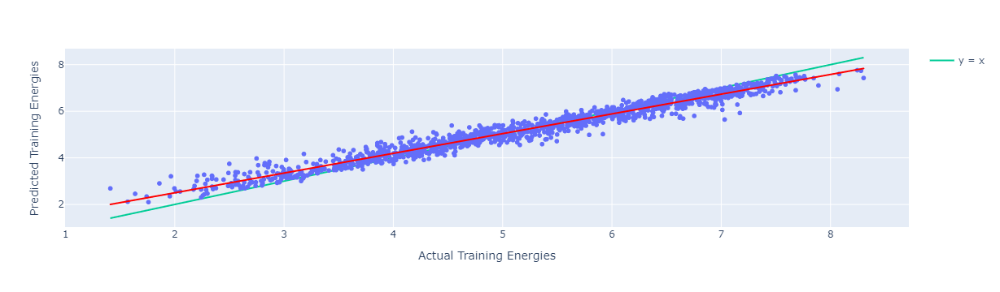

In [46]:
import plotly.express as px
# y_train_removed = np.delete(y_train,589)
# cm_pred_removed = np.delete(cm_predictions,589)
fig = px.scatter(x = scm_y_train, y = scm_predictions,trendline = 'ols',trendline_color_override = 'red', labels = {"x":"Actual Training Energies", "y":"Predicted Training Energies"})
# fig.update_xaxes(range = [1,9])
# fig.update_yaxes(range = [0,10])
fig.add_trace(go.Scatter(x=scm_y_train, y = scm_y_train, mode = "lines",name = "y = x"))
fig.show()

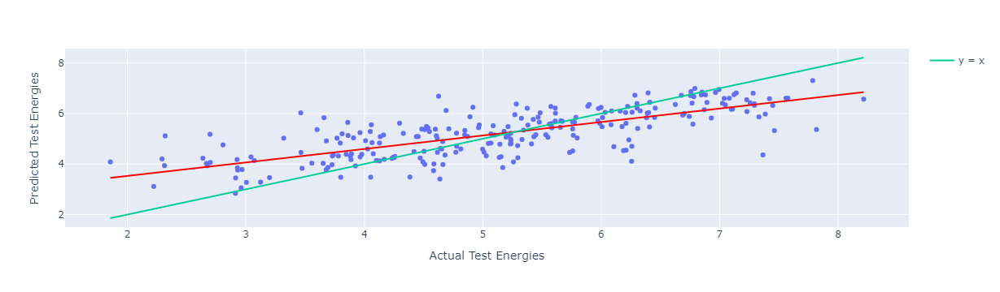

In [47]:
import plotly.express as p
fig = px.scatter(x = scm_y_test, y = scm_test_pred,trendline = 'ols',trendline_color_override = 'red', labels = {"x":"Actual Test Energies", "y":"Predicted Test Energies"})
# fig.update_xaxes(range = [1,9])
# fig.update_yaxes(range = [0,10])
fig.add_trace(go.Scatter(x=scm_y_test, y = scm_y_test, mode = "lines",name = "y = x"))

In [220]:
results_reduced = results_reduced.append({"Featuriser":"SineCoulombMatrix", "Model":"RandomForestRegressor", "train_rmse":scm_rmse, "test_rmse":scm_test_rmse, "train_r2":scm_train_r2, "test_r2":scm_test_r2, "feature_len":df_scm_reduced.shape[1]}, ignore_index = True)
results_reduced.head()

/tmp/ipykernel_51/4129015140.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_reduced = results_reduced.append({"Featuriser":"SineCoulombMatrix", "Model":"RandomForestRegressor", "train_rmse":scm_rmse, "test_rmse":scm_test_rmse, "train_r2":scm_train_r2, "test_r2":scm_test_r2, "feature_len":df_scm_reduced.shape[1]}, ignore_index = True)


,Featuriser,Model,train_rmse,test_rmse,train_r2,test_r2,feature_len
0,CoulombMatrix,RandomForestRegressor,0.335583,0.847717,0.942962,0.602354,27
1,SineCoulombMatrix,RandomForestRegressor,0.325138,0.891369,0.946457,0.560347,21


In [76]:
results["Featurisation Time"] = ["2:02:43", "15:23"]

In [77]:
results.head()

,Featuriser,Model,Training RMSE,Test RMSE,Featurisation Time
0,CoulombMatrix,RandomForestRegressor,0.320320,0.881679,2:02:43
1,SineCoulombMatrix,RandomForestRegressor,0.314919,0.883648,15:23


# SCM KFold

In [61]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestRegressor

rf_scm_cv = RandomForestRegressor()
output_scm = cross_validate(rf_scm_cv, df_scm_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)





NameError: name 'df_scm_reduced' is not defined

In [147]:
output_scm['test_score'].mean()

-0.8634513482886371

In [20]:
from sklearn.ensemble import GradientBoostingRegressor
kf = KFold(n_splits = 5, shuffle = True, random_state = 42)
gbr_cm = GradientBoostingRegressor()
output_gbr_cm = cross_validate(gbr_cm, df_scm_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)


In [21]:
output_gbr_cm['test_score'].mean()

-0.957624411016627

In [22]:
import xgboost
xg_cm = cross_validate(xgboost.XGBRegressor(verbosity=0), df_scm_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)
xg_cm["test_score"].mean()

/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: Future

-0.8748958557526088

In [152]:
output_scm_reduced["test_score"].mean()

-0.869875272920642

# CrystalNN

In [135]:
from matminer.featurizers.site.fingerprint import CrystalNNFingerprint
from matminer.featurizers.structure.sites import SiteStatsFingerprint
c = CrystalNNFingerprint.from_preset('ops')
ssf = SiteStatsFingerprint(c)
df_c = ssf.featurize_dataframe(df, col_id = "defect_structure_original")

SiteStatsFingerprint:   0%|          | 0/1667 [00:00<?, ?it/s]

/home/saaj/.local/lib/python3.8/site-packages/pymatgen/analysis/local_env.py:4135: UserWarning:

No oxidation states specified on sites! For better results, set the site oxidation states in the structure.

/home/saaj/.local/lib/python3.8/site-packages/pymatgen/analysis/local_env.py:3938: UserWarning:

CrystalNN: cannot locate an appropriate radius, covalent or atomic radii will be used, this can lead to non-optimal results.

/home/saaj/.local/lib/python3.8/site-packages/pymatgen/analysis/local_env.py:4135: UserWarning:

No oxidation states specified on sites! For better results, set the site oxidation states in the structure.

/home/saaj/.local/lib/python3.8/site-packages/pymatgen/analysis/local_env.py:3938: UserWarning:

CrystalNN: cannot locate an appropriate radius, covalent or atomic radii will be used, this can lead to non-optimal results.

/home/saaj/.local/lib/python3.8/site-packages/pymatgen/analysis/local_env.py:4135: UserWarning:

No oxidation states specified on sites! For b

In [23]:
df_c = pd.read_pickle("./defect_df_cnn_5")
df_c = df_c[df_c["defect_formation_energy"] > 0]

df_c_dropped = df_c.drop(["name","formula","mp_id", "host_structure", "defect_index", "defect_structure_relaxed", "defect_structure_original","defect_formation_energy"],axis=1)

In [24]:
df_c_reduced = corr_reduction(df_c_dropped.corr(), 0.9, df_c_dropped)
print(df_c_reduced.shape)
df_c_dropped.shape

(1665, 54)


(1665, 122)

# CrystalNN TestTrain

In [222]:
from sklearn.model_selection import train_test_split
c_train, c_test, c_y_train,c_y_test = train_test_split(df_c_reduced, y.to_numpy(), test_size = 0.15, random_state = 42)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf_c = RandomForestRegressor(random_state = 42)
rf_c.fit(c_train, c_y_train)

RandomForestRegressor(random_state=42)

In [ ]:
from sklearn.metrics import mean_squared_error
c_predictions = rf_c.predict(c_train)
c_rmse = np.sqrt(mean_squared_error(c_y_train,c_predictions))
print(c_rmse)

c_test_pred = rf_c.predict(c_test) 
c_test_rmse = np.sqrt(mean_squared_error(c_y_test,c_test_pred))
print(c_test_rmse)

0.33171730882993405
0.8267822382830584


In [ ]:
from sklearn.metrics import r2_score
c_train_r2 = r2_score(c_y_train,c_predictions)
c_test_r2 = r2_score(c_y_test,c_test_pred)

print(c_train_r2)
print(c_test_r2)

0.9442679658021921
0.6217513480073935


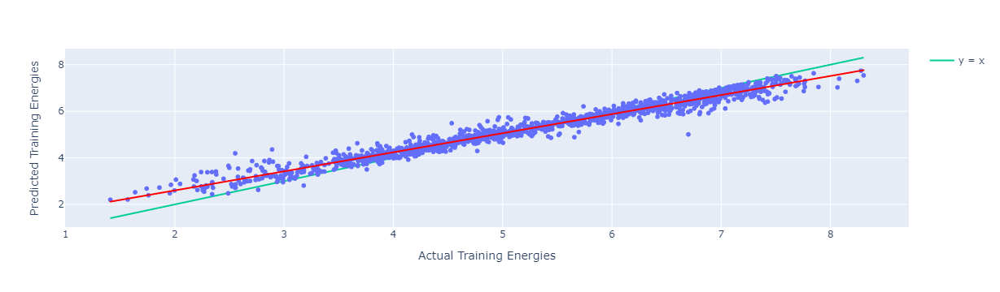

In [54]:
import plotly.express as px
# y_train_removed = np.delete(y_train,589)
# cm_pred_removed = np.delete(cm_predictions,589)
fig = px.scatter(x = c_y_train, y = c_predictions,trendline = 'ols',trendline_color_override = 'red', labels = {"x":"Actual Training Energies", "y":"Predicted Training Energies"})
# fig.update_xaxes(range = [1,9])
# fig.update_yaxes(range = [0,10])
fig.add_trace(go.Scatter(x=c_y_train, y = c_y_train, mode = "lines",name = "y = x"))
fig.show()

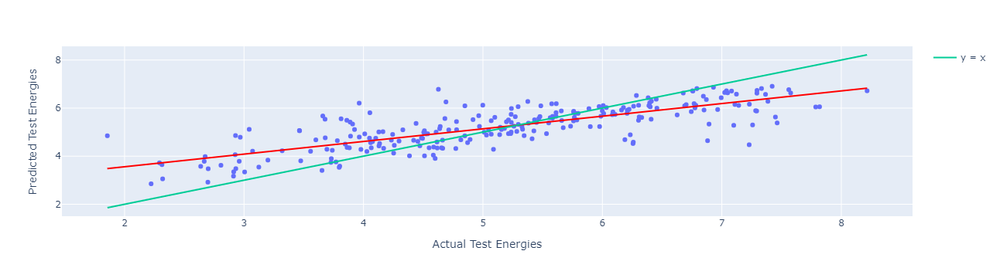

In [55]:
import plotly.express as p
fig = px.scatter(x = c_y_test, y = c_test_pred,trendline = 'ols',trendline_color_override = 'red', labels = {"x":"Actual Test Energies", "y":"Predicted Test Energies"})
# fig.update_xaxes(range = [1,9])
# fig.update_yaxes(range = [0,10])
fig.add_trace(go.Scatter(x=c_y_test, y = c_y_test, mode = "lines",name = "y = x"))

In [226]:
results_reduced = results_reduced.append({"Featuriser":"CrystalNNFingerprint", "Model":"RandomForestRegressor", "train_rmse":c_rmse, "test_rmse":c_test_rmse, "train_r2":c_train_r2, "test_r2":c_test_r2, "feature_len":df_c_reduced.shape[1]}, ignore_index = True)
results_reduced.head()

/tmp/ipykernel_51/4146432028.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_reduced = results_reduced.append({"Featuriser":"CrystalNNFingerprint", "Model":"RandomForestRegressor", "train_rmse":c_rmse, "test_rmse":c_test_rmse, "train_r2":c_train_r2, "test_r2":c_test_r2, "feature_len":df_c_reduced.shape[1]}, ignore_index = True)


,Featuriser,Model,train_rmse,test_rmse,train_r2,test_r2,feature_len
0,CoulombMatrix,RandomForestRegressor,0.335583,0.847717,0.942962,0.602354,27
1,SineCoulombMatrix,RandomForestRegressor,0.325138,0.891369,0.946457,0.560347,21
2,CrystalNNFingerprint,RandomForestRegressor,0.331717,0.826782,0.944268,0.621751,54


# CrystalNN KFold

In [162]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestRegressor

rf_c_cv = RandomForestRegressor()
output_c = cross_validate(rf_c_cv, df_c_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)





In [163]:
output_c['test_score'].mean()

-0.895914573371568

In [25]:
from sklearn.ensemble import GradientBoostingRegressor
kf = KFold(n_splits = 5, shuffle = True, random_state = 42)
gbr_cm = GradientBoostingRegressor()
output_gbr_cm = cross_validate(gbr_cm, df_c_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)


In [26]:
output_gbr_cm['test_score'].mean()

-1.0922143591381939

In [27]:
import xgboost
xg_cm = cross_validate(xgboost.XGBRegressor(), df_c_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)
xg_cm["test_score"].mean()

/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: Future

-0.8922420804990928

# Minor Featurisation

In [4]:
from matminer.featurizers.structure import DensityFeatures

d = DensityFeatures()
df_d = d.featurize_dataframe(df, col_id = "defect_structure_original")


NameError: name 'df' is not defined

In [168]:
from matminer.featurizers.structure.order import MaximumPackingEfficiency
mpe = MaximumPackingEfficiency()
df_d_mpe = mpe.featurize_dataframe(df_d, col_id = "defect_structure_original")

MaximumPackingEfficiency:   0%|          | 0/1667 [00:00<?, ?it/s]

In [9]:
from matminer.featurizers.structure import GlobalSymmetryFeatures
gs = GlobalSymmetryFeatures()
df_d_mpe= gs.featurize_dataframe(df_d_mpe, col_id = "defect_structure_original")



GlobalSymmetryFeatures:   0%|          | 0/1665 [00:00<?, ?it/s]

In [28]:
df_d_mpe = pd.read_pickle("./df_d_mpe_gs.pkl")
df_d_mpe = df_d_mpe[df_d_mpe["defect_formation_energy"] > 0]

df_d_mpe_dropped = df_d_mpe.drop(["name","formula","mp_id", "host_structure", "defect_index", "defect_structure_relaxed", "defect_structure_original","defect_formation_energy", "crystal_system"],axis=1)

In [115]:
df_d_mpe_dropped.head()

,density,vpa,packing fraction,max packing efficiency,spacegroup_num,crystal_system_int,is_centrosymmetric
1917,7.340130,11.959952,0.410482,0.300958,1,7,False
1827,5.662070,16.106118,0.733155,0.311252,1,7,False
352,5.551771,11.513054,0.685517,0.379453,1,7,False
91,5.085798,12.389093,0.794698,0.277284,8,6,False
1868,6.587255,15.571968,0.641528,0.265092,1,7,False


In [29]:
df_d_reduced = corr_reduction(df_d_mpe_dropped.corr(), 0.9, df_d_mpe_dropped)
print(df_d_reduced.shape)
print(df_d_mpe_dropped.shape)

(1665, 7)
(1665, 7)


# Minor TestTrain

In [180]:
from sklearn.model_selection import train_test_split
d_train, d_test, d_y_train,d_y_test = train_test_split(df_d_mpe_dropped, y.to_numpy(), test_size = 0.15, random_state = 42)

In [181]:
from sklearn.ensemble import RandomForestRegressor
rf_d = RandomForestRegressor(random_state = 42)
rf_d.fit(d_train, d_y_train)

RandomForestRegressor(random_state=42)

In [182]:
from sklearn.metrics import mean_squared_error
d_predictions = rf_d.predict(d_train)
d_rmse = np.sqrt(mean_squared_error(d_y_train,d_predictions))
print(d_rmse)

d_test_pred = rf_d.predict(d_test) 
d_test_rmse = np.sqrt(mean_squared_error(d_y_test,d_test_pred))
print(d_test_rmse)

0.3180347881180172
0.8535946844085077


In [183]:
from sklearn.metrics import r2_score
d_train_r2 = r2_score(d_y_train,d_predictions)
d_test_r2 = r2_score(d_y_test,d_test_pred)

print(d_train_r2)
print(d_test_r2)

0.9487707634671975
0.5968204307037476


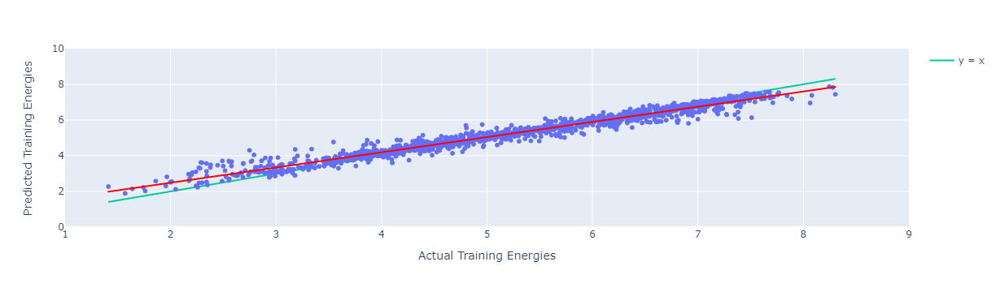

In [62]:
import plotly.express as px
# y_train_removed = np.delete(y_train,589)
# cm_pred_removed = np.delete(cm_predictions,589)
fig = px.scatter(x = d_y_train, y = d_predictions,trendline = 'ols',trendline_color_override = 'red', labels = {"x":"Actual Training Energies", "y":"Predicted Training Energies"})
fig.update_xaxes(range = [1,9])
fig.update_yaxes(range = [0,10])
fig.add_trace(go.Scatter(x=d_y_train, y = d_y_train, mode = "lines",name = "y = x"))
fig.show()

In [ ]:
import plotly.express as p
fig = px.scatter(x = d_y_test, y = d_test_pred,trendline = 'ols',trendline_color_override = 'red', labels = {"x":"Actual Test Energies", "y":"Predicted Test Energies"})
fig.update_xaxes(range = [1,9])
fig.update_yaxes(range = [0,10])
fig.add_trace(go.Scatter(x=d_y_test, y = d_y_test, mode = "lines",name = "y = x"))

In [227]:
results_reduced = results_reduced.append({"Featuriser":"Density-MPE-Symm", "Model":"RandomForestRegressor", "train_rmse":d_rmse, "test_rmse":d_test_rmse, "train_r2":d_train_r2, "test_r2":d_test_r2, "feature_len":df_d_mpe_dropped.shape[1]}, ignore_index = True)
results_reduced.head()

/tmp/ipykernel_51/2230552125.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_reduced = results_reduced.append({"Featuriser":"Density-MPE-Symm", "Model":"RandomForestRegressor", "train_rmse":d_rmse, "test_rmse":d_test_rmse, "train_r2":d_train_r2, "test_r2":d_test_r2, "feature_len":df_d_mpe_dropped.shape[1]}, ignore_index = True)


,Featuriser,Model,train_rmse,test_rmse,train_r2,test_r2,feature_len
0,CoulombMatrix,RandomForestRegressor,0.335583,0.847717,0.942962,0.602354,27
1,SineCoulombMatrix,RandomForestRegressor,0.325138,0.891369,0.946457,0.560347,21
2,CrystalNNFingerprint,RandomForestRegressor,0.331717,0.826782,0.944268,0.621751,54
3,Density-MPE-Symm,RandomForestRegressor,0.318035,0.853595,0.948771,0.596820,7


In [197]:
results.head()

AttributeError: 'NoneType' object has no attribute 'head'

# Minor KFold

In [33]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestRegressor

rf_d_cv = RandomForestRegressor()
output_d = cross_validate(rf_d_cv, df_d_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)





In [34]:
output_d['test_score'].mean()

-0.8629521550906902

In [30]:
from sklearn.ensemble import GradientBoostingRegressor
kf = KFold(n_splits = 5, shuffle = True, random_state = 42)
gbr_cm = GradientBoostingRegressor()
output_gbr_cm = cross_validate(gbr_cm, df_d_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)


In [31]:
output_gbr_cm['test_score'].mean()

-1.1009796079861585

In [32]:
import xgboost
xg_cm = cross_validate(xgboost.XGBRegressor(), df_d_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)
xg_cm["test_score"].mean()

/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: Future

-0.8565113258278421

# SOAP

In [3]:
import pandas as pd
df_soap = pd.read_pickle("./defect_df_soap.pkl")
df_soap = df_soap[df_soap["defect_formation_energy"] > 0]

df_soap_dropped = df_soap.drop(["name","formula","mp_id", "host_structure", "defect_index", "defect_structure_relaxed", "defect_structure_original","defect_formation_energy"],axis=1)

In [4]:
df_soap_dropped.shape

(1665, 13230)

In [9]:
import numpy as np 
df_soap_reduced = corr_reduction(df_soap_dropped.corr(), 0.9, df_soap_dropped)
print(df_soap_reduced.shape)
print(df_soap_dropped.shape)

(1665, 769)
(1665, 13230)


In [10]:
df_soap_reduced.to_pickle("./df_soap_reduced_host.pkl")

In [11]:
df_soap_reduced = pd.read_pickle("./df_soap_reduced_host.pkl")

In [12]:
df_soap_reduced

,mean SOAP_0,mean SOAP_1,std_dev SOAP_1,std_dev SOAP_18,std_dev SOAP_20,mean SOAP_21,mean SOAP_22,mean SOAP_26,std_dev SOAP_26,mean SOAP_31,...,mean SOAP_6510,mean SOAP_6511,mean SOAP_6515,mean SOAP_6520,mean SOAP_6532,mean SOAP_6536,mean SOAP_6541,mean SOAP_6553,mean SOAP_6574,mean SOAP_6595
1917,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1827,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
352,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
91,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1868,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1638,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1095,0.039155,-0.148620,0.036540,73.019879,51.467169,0.004901,-0.008617,0.090946,0.057189,-0.161291,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1130,0.019325,-0.057831,0.003446,85.896909,34.129362,0.009374,-0.016154,0.262593,0.264668,-0.452513,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1294,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Soap TestTrain

In [229]:
from sklearn.model_selection import train_test_split
soap_train, soap_test, soap_y_train,soap_y_test = train_test_split(df_soap_reduced, y.to_numpy(), test_size = 0.15, random_state = 42)

In [230]:
from sklearn.ensemble import RandomForestRegressor
rf_soap = RandomForestRegressor(random_state = 42)
rf_soap.fit(soap_train, soap_y_train)

RandomForestRegressor(random_state=42)

In [231]:
from sklearn.metrics import mean_squared_error
soap_predictions = rf_soap.predict(soap_train)
soap_rmse = np.sqrt(mean_squared_error(soap_y_train,soap_predictions))
print(soap_rmse)

soap_test_pred = rf_soap.predict(soap_test) 
soap_test_rmse = np.sqrt(mean_squared_error(soap_y_test,soap_test_pred))
print(soap_test_rmse)

0.25384898357617874
0.7171880588608798


In [232]:
from sklearn.metrics import r2_score
soap_train_r2 = r2_score(soap_y_train,soap_predictions)
soap_test_r2 = r2_score(soap_y_test,soap_test_pred)

print(soap_train_r2)
print(soap_test_r2)

0.9673623045336254
0.7153827536068464


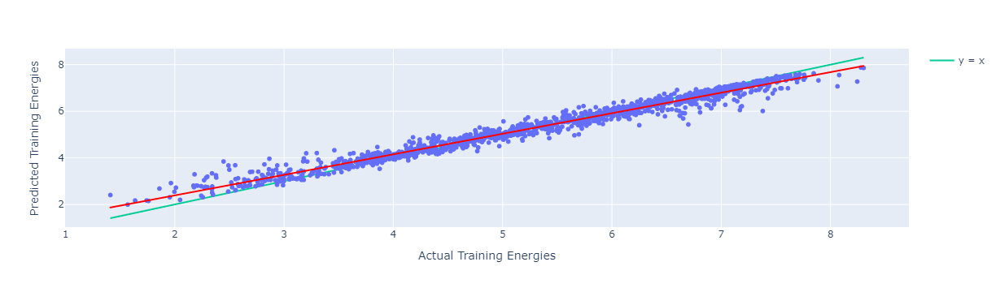

In [70]:
import plotly.express as px
import plotly.graph_objects as go
# y_train_removed = np.delete(y_train,589)
# cm_pred_removed = np.delete(cm_predictions,589)
fig = px.scatter(x = soap_y_train, y = soap_predictions,trendline = 'ols',trendline_color_override = 'red', labels = {"x":"Actual Training Energies", "y":"Predicted Training Energies"})
# fig.update_xaxes(range = [1,9])
# fig.update_yaxes(range = [0,10])
fig.add_trace(go.Scatter(x=soap_y_train, y = soap_y_train, mode = "lines",name = "y = x"))
fig.show()

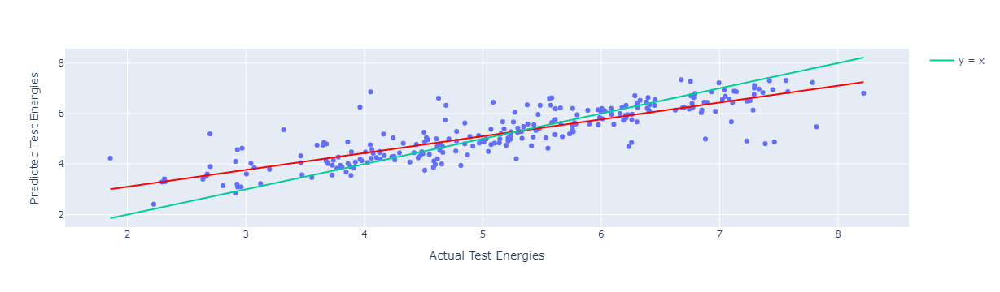

In [72]:
import plotly.express as px
fig = px.scatter(x = soap_y_test, y = soap_test_pred,trendline = 'ols',trendline_color_override = 'red', labels = {"x":"Actual Test Energies", "y":"Predicted Test Energies"})
# fig.update_xaxes(range = [1,9])
# fig.update_yaxes(range = [0,10])
fig.add_trace(go.Scatter(x=soap_y_test, y = soap_y_test, mode = "lines",name = "y = x"))

In [233]:
results_reduced = results_reduced.append({"Featuriser":"SOAP", "Model":"RandomForestRegressor", "train_rmse":soap_rmse, "test_rmse":soap_test_rmse, "train_r2":soap_train_r2, "test_r2":soap_test_r2, "feature_len":df_soap_reduced.shape[1]}, ignore_index = True)
results_reduced.head()

/tmp/ipykernel_51/1940052366.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_reduced = results_reduced.append({"Featuriser":"SOAP", "Model":"RandomForestRegressor", "train_rmse":soap_rmse, "test_rmse":soap_test_rmse, "train_r2":soap_train_r2, "test_r2":soap_test_r2, "feature_len":df_soap_reduced.shape[1]}, ignore_index = True)


,Featuriser,Model,train_rmse,test_rmse,train_r2,test_r2,feature_len
0,CoulombMatrix,RandomForestRegressor,0.335583,0.847717,0.942962,0.602354,27
1,SineCoulombMatrix,RandomForestRegressor,0.325138,0.891369,0.946457,0.560347,21
2,CrystalNNFingerprint,RandomForestRegressor,0.331717,0.826782,0.944268,0.621751,54
3,Density-MPE-Symm,RandomForestRegressor,0.318035,0.853595,0.948771,0.596820,7
4,SOAP,RandomForestRegressor,0.253849,0.717188,0.967362,0.715383,769


In [234]:
results_reduced.to_pickle("results_reduced_featurisers.pkl")

# SOAP KFold

In [22]:
y = df["defect_formation_energy"]
y.head()

1917    6.034068
1827    6.877819
352     6.900110
91      7.094550
1868    4.234480
Name: defect_formation_energy, dtype: float64

In [23]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestRegressor
kf = KFold(n_splits = 5, shuffle = True, random_state = 42)

rf_soap_cv = RandomForestRegressor()
output_soap = cross_validate(rf_soap_cv, df_soap_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)





In [12]:
output_soap['test_score'].mean()

-0.7201272500278296

In [34]:
from sklearn.ensemble import GradientBoostingRegressor
kf = KFold(n_splits = 5, shuffle = True, random_state = 42)
gbr_cm = GradientBoostingRegressor()
output_gbr_cm = cross_validate(gbr_cm, df_soap_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)


In [35]:
output_gbr_cm['test_score'].mean()

-0.7829918259167749

In [ ]:
import xgboost
xg_cm = cross_validate(xgboost.XGBRegressor(), df_soap_reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)
xg_cm["test_score"].mean()

/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


# SOAP Iteration

In [13]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestRegressor
kf = KFold(n_splits = 5, shuffle = True, random_state = 42)

rf_soap_cv = RandomForestRegressor()
def iterative_remove(df_imp, df_data):
    df_reduced = df_data
    df_imp = df_imp.sort_values("average")
    idx = round(len(df_imp)*0.10)
    df_imp = df_imp[idx:]
    to_keep = df_imp.index.values.tolist()
    df_reduced = df_data[to_keep]
    return df_reduced
def iterative_train(overall,reduced,kf,rf,y):
    importances = {}
    while len(reduced) > 100:
        reduced = iterative_remove(overall,reduced)
        output = cross_validate(rf, reduced, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)
        overall = extract_importances(output)
        importances[len(overall)] = output['test_score'].mean()
        
    return output, overall, reduced, importances

In [26]:
overall_soap_df = extract_importances(output_soap)


In [27]:
df_soap_reduced1 = iterative_remove(overall_soap_df,df_soap_reduced)
output_soap1 = cross_validate(rf_soap_cv, df_soap_reduced1, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df1 = extract_importances(output_soap1)


In [28]:
df_soap_reduced2 = iterative_remove(overall_soap_df1,df_soap_reduced)
output_soap2 = cross_validate(rf_soap_cv, df_soap_reduced2, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df2 = extract_importances(output_soap2)


In [29]:
df_soap_reduced3 = iterative_remove(overall_soap_df2,df_soap_reduced)
output_soap3 = cross_validate(rf_soap_cv, df_soap_reduced3, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df3 = extract_importances(output_soap3)


In [30]:
df_soap_reduced4 = iterative_remove(overall_soap_df3,df_soap_reduced)
output_soap4 = cross_validate(rf_soap_cv, df_soap_reduced4, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df4 = extract_importances(output_soap4)


In [31]:
output_soap4["test_score"].mean()

-0.7093239963853263

In [32]:
df_soap_reduced5 = iterative_remove(overall_soap_df4,df_soap_reduced)
output_soap5 = cross_validate(rf_soap_cv, df_soap_reduced5, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df5 = extract_importances(output_soap5)


In [33]:
df_soap_reduced6 = iterative_remove(overall_soap_df5,df_soap_reduced)
output_soap6 = cross_validate(rf_soap_cv, df_soap_reduced6, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df6 = extract_importances(output_soap6)


In [34]:
df_soap_reduced7 = iterative_remove(overall_soap_df6,df_soap_reduced)
output_soap7 = cross_validate(rf_soap_cv, df_soap_reduced7, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df7 = extract_importances(output_soap7)


In [35]:
df_soap_reduced8 = iterative_remove(overall_soap_df7,df_soap_reduced)
output_soap8 = cross_validate(rf_soap_cv, df_soap_reduced8, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df8 = extract_importances(output_soap8)


In [36]:
df_soap_reduced9 = iterative_remove(overall_soap_df8,df_soap_reduced)
output_soap9 = cross_validate(rf_soap_cv, df_soap_reduced9, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df9 = extract_importances(output_soap9)


In [37]:
df_soap_reduced10 = iterative_remove(overall_soap_df9,df_soap_reduced)
output_soap10 = cross_validate(rf_soap_cv, df_soap_reduced10, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df10 = extract_importances(output_soap10)


In [38]:
df_soap_reduced11 = iterative_remove(overall_soap_df10,df_soap_reduced)
output_soap11 = cross_validate(rf_soap_cv, df_soap_reduced11, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df11 = extract_importances(output_soap11)


In [39]:
df_soap_reduced12 = iterative_remove(overall_soap_df11,df_soap_reduced)
output_soap12 = cross_validate(rf_soap_cv, df_soap_reduced12, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df12 = extract_importances(output_soap12)


In [40]:
rf_soap_test13 = RandomForestRegressor(n_estimators = 450)
df_soap_reduced13 = iterative_remove(overall_soap_df12,df_soap_reduced)
output_soap13 = cross_validate(rf_soap_test13, df_soap_reduced13, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df13 = extract_importances(output_soap13)


In [101]:
output_soap20['test_score'].mean()

-0.727250166349215

In [41]:
df_soap_reduced14 = iterative_remove(overall_soap_df13,df_soap_reduced)
output_soap14 = cross_validate(rf_soap_cv, df_soap_reduced14, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df14 = extract_importances(output_soap14)


In [42]:
df_soap_reduced15 = iterative_remove(overall_soap_df14,df_soap_reduced)
output_soap15 = cross_validate(rf_soap_cv, df_soap_reduced15, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df15 = extract_importances(output_soap15)


In [43]:
df_soap_reduced16 = iterative_remove(overall_soap_df15,df_soap_reduced)
output_soap16 = cross_validate(rf_soap_cv, df_soap_reduced16, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df16 = extract_importances(output_soap16)


In [44]:
df_soap_reduced17 = iterative_remove(overall_soap_df16,df_soap_reduced)
output_soap17 = cross_validate(rf_soap_cv, df_soap_reduced17, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df17 = extract_importances(output_soap17)


In [45]:
df_soap_reduced18 = iterative_remove(overall_soap_df17,df_soap_reduced)
output_soap18 = cross_validate(rf_soap_cv, df_soap_reduced18, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df18 = extract_importances(output_soap18)


In [46]:
df_soap_reduced19 = iterative_remove(overall_soap_df18,df_soap_reduced)
output_soap19 = cross_validate(rf_soap_cv, df_soap_reduced19, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df19 = extract_importances(output_soap19)


In [47]:
df_soap_reduced20 = iterative_remove(overall_soap_df19,df_soap_reduced)
output_soap20 = cross_validate(rf_soap_cv, df_soap_reduced20, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

overall_soap_df20 = extract_importances(output_soap20)


In [91]:
df_soap_reduced19.shape

(1665, 103)

In [53]:
output_soap20['test_score'].shape

TypeError: 'tuple' object is not callable

In [55]:
df_soap_reduced12.to_pickle("df_soap_host_217.pkl")

In [48]:
output_list = [output_soap,output_soap1,output_soap2,output_soap3,output_soap4,output_soap5,output_soap6,output_soap7,output_soap8,output_soap9,output_soap10,output_soap11,output_soap12,output_soap13,output_soap14,output_soap15,output_soap16,output_soap17,output_soap18,output_soap19,output_soap20]
output_list_df = [df_soap_reduced,df_soap_reduced1,df_soap_reduced2,df_soap_reduced3,df_soap_reduced4,df_soap_reduced5,df_soap_reduced6,df_soap_reduced7,df_soap_reduced8,df_soap_reduced9,df_soap_reduced10,df_soap_reduced11,df_soap_reduced12,df_soap_reduced13,df_soap_reduced14,df_soap_reduced15,df_soap_reduced16,df_soap_reduced17,df_soap_reduced18,df_soap_reduced19,df_soap_reduced20]


<AxesSubplot:xlabel='Length', ylabel='Average RMSE Score (5CV)'>

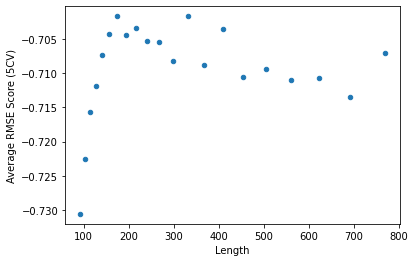

In [49]:
soap_lens = [x.shape[1] for x in output_list_df]
soap_scores = [x['test_score'].mean() for x in output_list]
df_soap_reduction = pd.DataFrame({"Length":soap_lens, "Average RMSE Score (5CV)":soap_scores})
df_soap_reduction.plot.scatter(x = "Length", y = "Average RMSE Score (5CV)")

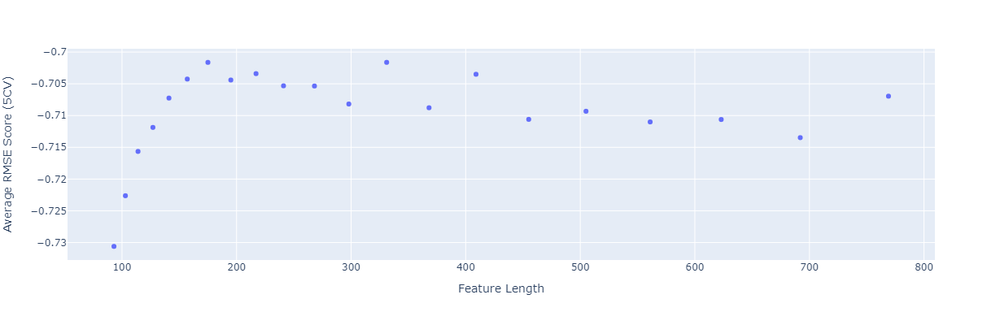

In [50]:
import plotly.express as px

px.scatter(df_soap_reduction, x = "Length", y = "Average RMSE Score (5CV)", width= 700, height = 400, labels = {"Length":"Feature Length"})

In [96]:
import dill                            #pip install dill --user
filename = 'dillsoapscores.pkl'
dill.dump_session(filename)


# Grid Search SOAP

In [151]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 

kf3 = KFold(n_splits = 3, shuffle = True, random_state = 42)

param_grid = {
    'bootstrap': [True],
    'max_depth': [None],
    'max_features': [2, 3],
    'min_samples_leaf': [1,2,3,4],
    'min_samples_split': [2,4,6],
    'n_estimators': [50,100, 200, 300, 400, 500]
}
n_grid = {
    'n_estimators' : [10,50,100,150,200,250,300,350,400,450,500]
    
}
# Create a based model
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf_soap_cv, param_grid =param_grid, 
                          cv = kf, n_jobs = -1, verbose = 1,scoring = 'neg_root_mean_squared_error')

In [152]:
grid_search.fit(df_soap_reduced13,y)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'bootstrap': [True], 'max_depth': [None],
                         'max_features': [2, 3],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'min_samples_split': [2, 4, 6],
                         'n_estimators': [50, 100, 200, 300, 400, 500]},
             scoring='neg_root_mean_squared_error', verbose=1)

In [153]:
grid_search.best_params_

{'bootstrap': True,
 'max_depth': None,
 'max_features': 3,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 500}

In [154]:
grid_search.best_score_

-0.7156461791054816

In [116]:
results_df = pd.DataFrame(grid_search.cv_results_)

In [100]:
rf_best = grid_search.best_estimator_
print(rf_best)

NameError: name 'grid_search' is not defined

In [121]:
output_soap = cross_validate(rf_best, df_soap_reduced13, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)


In [123]:
output_soap['test_score'].mean()

-0.8551624967604002

# GBR SOAP

In [1]:
import dill
dill.load_session("dillsoapscores.pkl")

In [4]:
from sklearn.ensemble import GradientBoostingRegressor

gbr_soap = GradientBoostingRegressor()
output_soap = cross_validate(gbr_soap, df_soap_reduced13, y, cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)
print(output_soap['test_score'].mean())


-0.7753514930884905


In [156]:
output_soap['test_score']

array([-0.79135344, -0.78062351, -0.72910322, -0.79239888, -0.78522584])

In [22]:
from sklearn.model_selection import GridSearchCV
kf3 = KFold(n_splits = 3, shuffle = True, random_state = 42)

grid = {
    'learning_rate' : [0.1,0.2,0.5,1.0],
    'n_estimators' : [100,200,500],
    'subsample' : [0.5,1.0,2.0],
    'max_depth': [None,1,3,4],
    'max_features': [2, 3],
    'min_samples_leaf': [1,2,3,4],
    'min_samples_split': [2,4,6]
}

grid2 = {
    'learning_rate' : [0.15,0.20,0.15],
    'n_estimators' : [400,500,750],
    'subsample' : [0.9,1.0,1.1],
    'max_depth': [5,6,7],
    'max_features': [4,5,6],
    'min_samples_leaf': [3,4,5,6],
    'min_samples_split': [6,8,10]
}
grid_search_gbr = GridSearchCV(estimator = gbr_soap, param_grid =grid2, 
                          cv = kf3, n_jobs = -1, verbose = 1,scoring = 'neg_root_mean_squared_error')


In [23]:
grid_search_gbr.fit(df_soap_reduced13,y)


Fitting 3 folds for each of 2916 candidates, totalling 8748 fits


/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
2916 fits failed out of a total of 8748.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2916 fits failed with the following error:
Traceback (most recent call last):
  File "/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/sklearn/ensemble/_gb.py", line 525, in fit
    self._check_params()
  File "/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/sklearn/ensemble/_gb.py", line 317, in _check_para

GridSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
             estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.15, 0.2, 0.15],
                         'max_depth': [5, 6, 7], 'max_features': [4, 5, 6],
                         'min_samples_leaf': [3, 4, 5, 6],
                         'min_samples_split': [6, 8, 10],
                         'n_estimators': [400, 500, 750],
                         'subsample': [0.9, 1.0, 1.1]},
             scoring='neg_root_mean_squared_error', verbose=1)

In [12]:
grid_search_gbr.best_score_

-0.6130311095758793

In [13]:
grid_search_gbr.best_params_

{'learning_rate': 0.15,
 'max_depth': 5,
 'max_features': 4,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 400,
 'subsample': 1.0}

In [74]:
from matminer.featurizers.site.external import SOAP
from matminer.featurizers.structure.sites import SiteStatsFingerprint
import numpy as np

class SOAPmod(SOAP):

    def fit(self, X, y=None):
        super().fit(X, y)
        self.length = int(self.length / len(self.atomic_numbers) )
        return self

    def featurize(self, struct, idx):
        if self.crossover:
            raise ValueError("This featurizer only works if crossover=False")
            
        features = np.array(super().featurize(struct, idx))
        
        # get the features with the shape (nelements, nfeatures)
        features = features.reshape((len(self.atomic_numbers), -1))
        
        # take the average across elements
        return features.sum(axis=0) / len(self.atomic_numbers) 
    
feat_mod = SOAPmod.from_preset("formation_energy")
feat_mod.crossover = False

ssf_mod = SiteStatsFingerprint(feat_mod)
ssf_mod.set_n_jobs(1)
ssf_mod.fit(df["defect_structure_original"])
ssf_mod.featurize_dataframe(df, "defect_structure_original")

KeyboardInterrupt: 

In [15]:
from sklearn.model_selection import train_test_split
soap_train, soap_test, soap_y_train,soap_y_test = train_test_split(df_soap_reduced13, y.to_numpy(), test_size = 0.15, random_state = 42)

In [18]:
# {'learning_rate': 0.15,
 # 'max_depth': 5,
 # 'max_features': 4,
 # 'min_samples_leaf': 3,
 # 'min_samples_split': 8,
 # 'n_estimators': 400,
 # 'subsample': 1.0} for gbr_opt
gbr_opt.fit(soap_train, soap_y_train)

GradientBoostingRegressor(learning_rate=0.15, max_depth=5, max_features=4,
                          min_samples_leaf=3, min_samples_split=8,
                          n_estimators=400)

In [19]:
from sklearn.metrics import mean_squared_error
soap_predictions = gbr_opt.predict(soap_train)
soap_rmse = np.sqrt(mean_squared_error(soap_y_train,soap_predictions))
print(soap_rmse)

soap_test_pred = gbr_opt.predict(soap_test) 
soap_test_rmse = np.sqrt(mean_squared_error(soap_y_test,soap_test_pred))
print(soap_test_rmse)

0.13852680214358076
0.6126364067754831


# Decision Tree

In [32]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor()
dtr_out = cross_validate(dtr, df_soap_reduced13, y,  cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

In [34]:
dtr_out['test_score']

array([-0.99518324, -0.77799627, -0.90251849, -0.84222861, -0.97720815])

In [37]:
dtr_param_grid = {'max_features': ['auto', 'sqrt', 'log2'],
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [5, 6, 7, 8, 9],
              'criterion' :['squared_error', 'friedman_mse', 'absolute_error', 'poisson']
             }

grid_search_dtr = GridSearchCV(estimator = dtr, param_grid =dtr_param_grid, 
                          cv = kf3, n_jobs = -1, verbose = 1,scoring = 'neg_root_mean_squared_error')


In [38]:
grid_search_dtr.fit(df_soap_reduced13, y)

Fitting 3 folds for each of 180 candidates, totalling 540 fits


GridSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
             estimator=DecisionTreeRegressor(), n_jobs=-1,
             param_grid={'ccp_alpha': [0.1, 0.01, 0.001],
                         'criterion': ['squared_error', 'friedman_mse',
                                       'absolute_error', 'poisson'],
                         'max_depth': [5, 6, 7, 8, 9],
                         'max_features': ['auto', 'sqrt', 'log2']},
             scoring='neg_root_mean_squared_error', verbose=1)

In [39]:
grid_search_dtr.best_score_

-1.049818869637133

# SVM

In [40]:
from sklearn.svm import SVR
svr = SVR()
svr_out = cross_validate(svr, df_soap_reduced13, y,  cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)

In [42]:
svr.get_params()

{'C': 1.0,
 'cache_size': 200,
 'coef0': 0.0,
 'degree': 3,
 'epsilon': 0.1,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

In [51]:
svr_param_grid = {'kernel': [ 'rbf']
             }

grid_search_svr = GridSearchCV(estimator = svr, param_grid =svr_param_grid, 
                          cv = kf3, n_jobs = -1, verbose = 2,scoring = 'neg_root_mean_squared_error')

In [53]:
grid_search_svr.fit(df_soap_reduced13,y)
grid_search_svr.best_score_

Fitting 3 folds for each of 1 candidates, totalling 3 fits


-1.179708090052958

# KNN

In [57]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor()
knn_out = cross_validate(knn, df_soap_reduced13, y,  cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)
knn_out['test_score']

array([-1.15099603, -1.07011269, -1.14940327, -1.12515393, -1.13222057])

[CV] END .........................................kernel=rbf; total time=   0.2s
[CV] END .........................................kernel=rbf; total time=   0.2s
[CV] END .........................................kernel=rbf; total time=   0.2s
[CV] END .........................................kernel=rbf; total time=   0.2s
[CV] END .........................................kernel=rbf; total time=   0.2s
[CV] END .........................................kernel=rbf; total time=   0.2s


# XGBoost

In [80]:
from xgboost import XGBRegressor
xgbr = XGBRegressor(params = {'colsample_bytree':0.4,
 'gamma': 0.2,
 'learning_rate': 0.15,
 'max_depth': 8,
 'min_child_weight':3})
xgbr_out = cross_validate(xgbr, df_soap_reduced13, y,  cv = kf, scoring = 'neg_root_mean_squared_error', return_estimator = True)
print(xgbr_out['test_score'].mean())
print(xgbr_out['test_score'])

/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[15:13:36] WARNING: ../src/learner.cc:576: 
Parameters: { "params" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[15:13:37] WARNING: ../src/learner.cc:576: 
Parameters: { "params" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[15:13:38] WARNING: ../src/learner.cc:576: 
Parameters: { "params" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[15:13:39] WARNING: ../src/learner.cc:576: 
Parameters: { "params" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[15:13:39] WARNING: ../src/learner.cc:576: 
Parameters: { "params" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


-0.6368799864809342
[-0.62625733 -0.65738165 -0.64438218 -0.65874369 -0.59763508]


In [81]:
xgbr.get_params()

{'objective': 'reg:squarederror',
 'base_score': None,
 'booster': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'enable_categorical': False,
 'gamma': None,
 'gpu_id': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_delta_step': None,
 'max_depth': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None,
 'params': {'colsample_bytree': 0.4,
  'gamma': 0.2,
  'learning_rate': 0.15,
  'max_depth': 8,
  'min_child_weight': 3}}

In [68]:
gsc = GridSearchCV(
            estimator=XGBRegressor(),
            param_grid={"learning_rate": (0.05, 0.10, 0.15),
                        "max_depth": [ 3, 4, 5, 6, 8],
                        "min_child_weight": [ 1, 3, 5, 7],
                        "gamma":[ 0.0, 0.1, 0.2],
                        "colsample_bytree":[ 0.3, 0.4],},
            cv=kf, scoring='neg_root_mean_squared_error', verbose=1)
gsc.fit(df_soap_reduced13,y)

Fitting 5 folds for each of 360 candidates, totalling 1800 fits


/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/saaj/miniconda3/envs/matminer/lib/python3.8/site-packages/xgboost/data.py:250: Future

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    enable_categorical=False, gamma=None,
                                    gpu_id=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight...
                                    num_parallel_tree=None, predictor=None,
                                    random_state=None, reg_alpha=None,
                                    reg_lambda=None, scale_pos_weight=None,
                                    subsample=None, tree_method=None,
                                    

In [69]:
gsc.best_score_

-0.3923181439918377

In [76]:
gsc.best_params_

{'colsample_bytree': 0.4,
 'gamma': 0.2,
 'learning_rate': 0.15,
 'max_depth': 8,
 'min_child_weight': 3}

In [63]:
gsc.best_params_

{'colsample_bytree': 0.4,
 'gamma': 0.1,
 'learning_rate': 0.15,
 'max_depth': 8,
 'min_child_weight': 1}

In [71]:
xgbr_opt = gsc.best_estimator_

In [78]:
from sklearn.metrics import mean_squared_error
soap_predictions = gsc.predict(soap_train)
soap_rmse = np.sqrt(mean_squared_error(soap_y_train,soap_predictions))
print(soap_rmse)

soap_test_pred = gsc.predict(soap_test) 
soap_test_rmse = np.sqrt(mean_squared_error(soap_y_test,soap_test_pred))
print(soap_test_rmse)

0.19853762336285777
0.18563517616479422


In [2]:
import pandas as pd
deltaimp = pd.read_pickle("SOAPDeltaImportances.pkl")

In [12]:
deltaimp = deltaimp.rename(columns = {"RMSE Scores (5 Fold CV)":"Average RMSE Score (5CV)"})

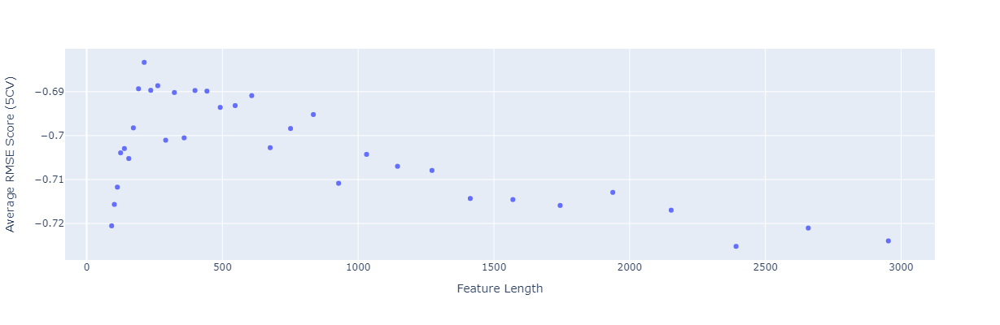

In [13]:
import plotly.express as px

px.scatter(deltaimp, x = "Feature Length", y = "Average RMSE Score (5CV)", width= 700, height = 400)